In [1]:
import numpy as np 
import cv2 
import glob 
import matplotlib.pyplot as plt 

In [2]:
nx = 9
ny = 6

objp = np.zeros((nx*ny, 3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

In [3]:
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

In [4]:
# Make a list of calibration images
images = glob.glob('camera_cal/cal*.jpg')
print(len(images))

20


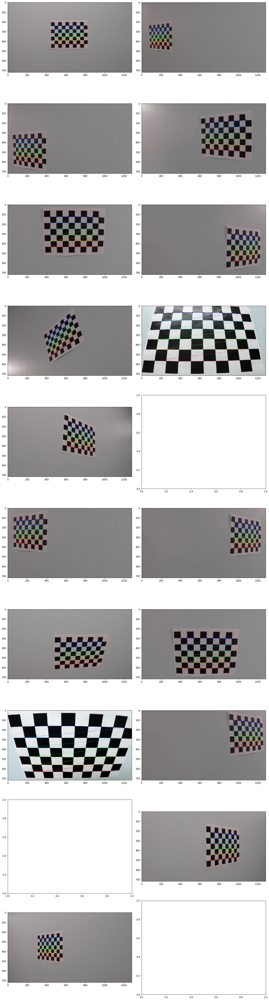

In [5]:
# find corners in each image, and draw + plot them 
fig, axs = plt.subplots(10, 2, figsize=(16, 60))
fig.tight_layout()

for idx, file in enumerate(images):
    img = cv2.imread(file)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # find corners 
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    
    if ret:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        
        axs[idx//2, idx%2].imshow(img)

In [6]:
import pickle 
%matplotlib inline

In [8]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (img.shape[1], img.shape[0]), None, None)

dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist

pickle.dump(dist_pickle, open( "dist_pickle.p", "wb" ) )

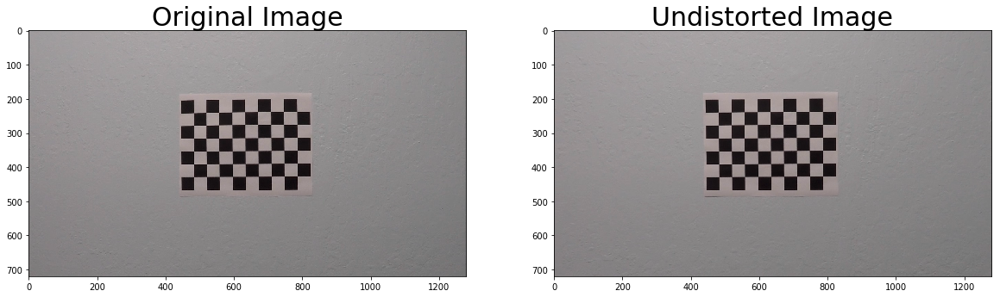

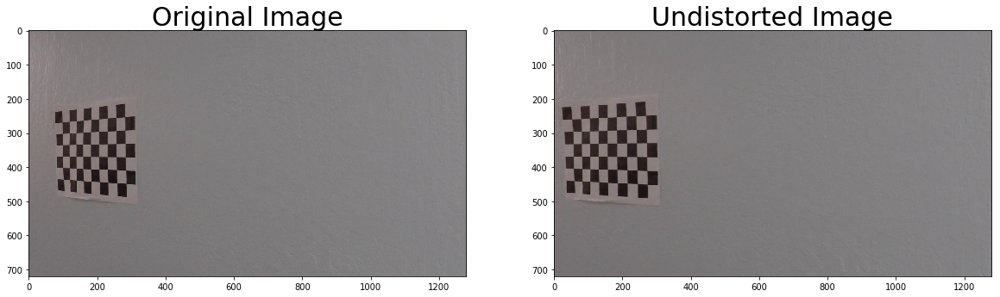

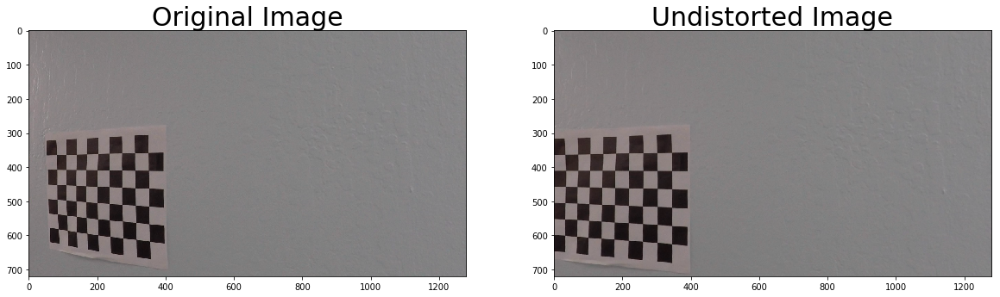

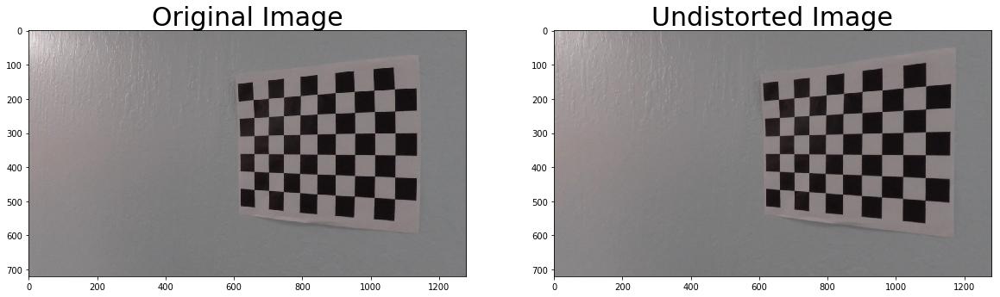

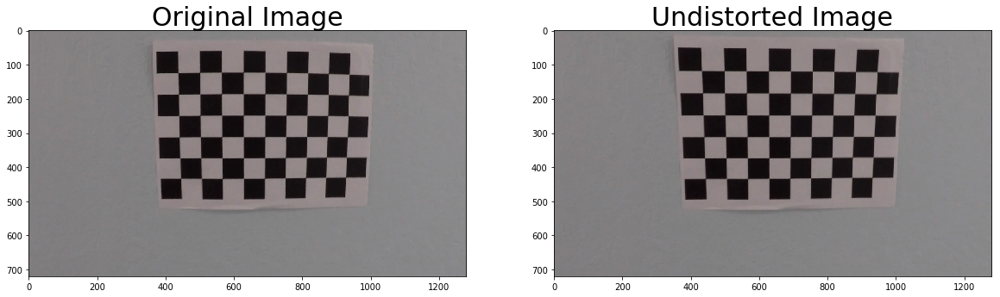

...

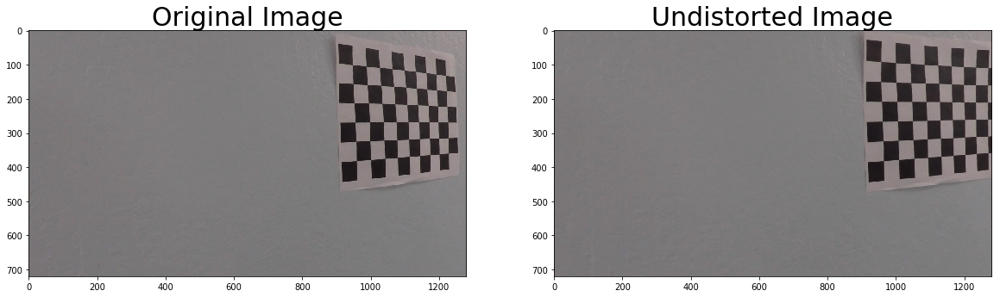

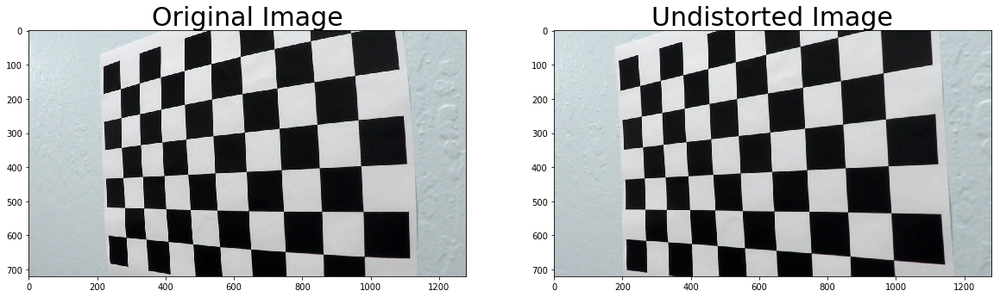

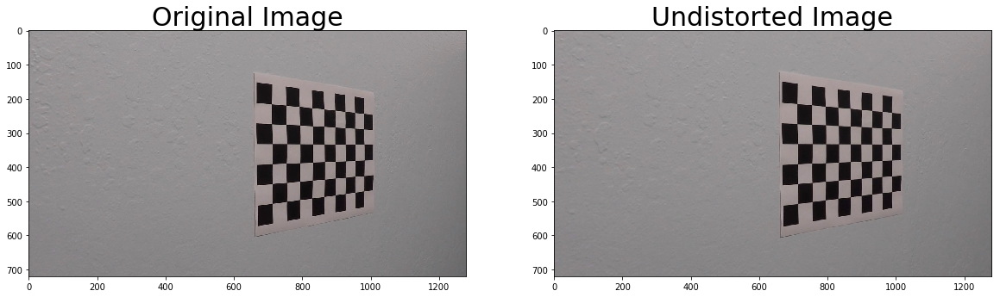

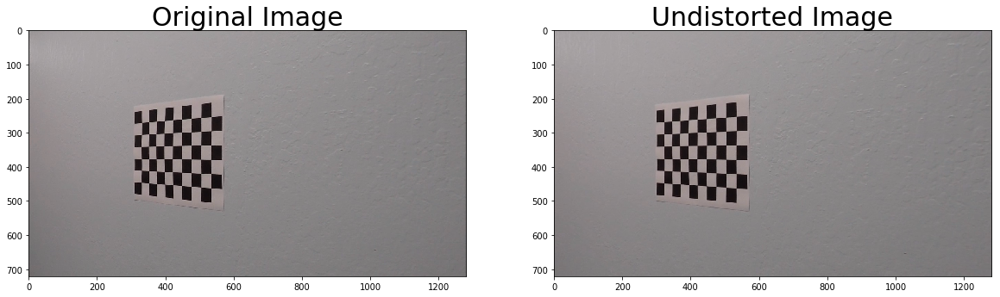

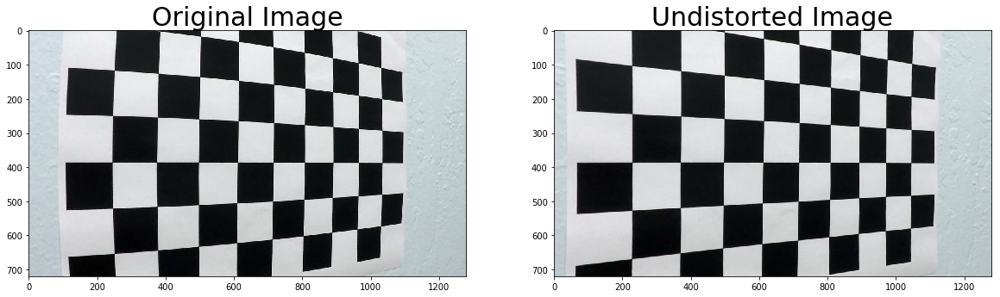

In [9]:

for index, fname in enumerate(images):
    img = cv2.imread(fname)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)